# 02 YRT Renewal Pricing term = 10 at ALL Agents

---
## 0. Setup

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
np.set_printoptions(precision=3)  # 数値桁数を指定．
plt.style.use('seaborn-colorblind')
plt.style.use('seaborn-whitegrid')

import importlib
import itertools

import sys
sys.path.append('../../RLPack')
import ModelInspection  # original DRL code

Using TensorFlow backend.


---
## 1. Environment
- 毎年YRT（一時払定期）の保険料を設定する環境．1年更新であり，新規契約者はNB・既存契約者（あるいは保有）はIFで表す．
- 新規契約者は価格に敏感だが，既存契約者は価格に敏感でない，という前提でモデルしている．このため，初期の頃は低価格で保有を増やして，後に値上げすることが最適戦略になるように考えている．

注意点
- 値のオーダーを±10程度に抑えるようにすること．NNの場合，レンジを大きく外れると，最終層のシグモイド関数が飽和したり，オプティマイザがうまく働かないという問題がある．
- 時間（ステップ）を状態情報に含めること．時間情報の無い場合，最終時点以外では安売りしてその次で値上げするのが最適戦略になるが，最終時点では程々の値段で販売するのが最適戦略となる．このため，時間情報が状態情報に含まれない場合，この2つの間で解が収束しなくなる．

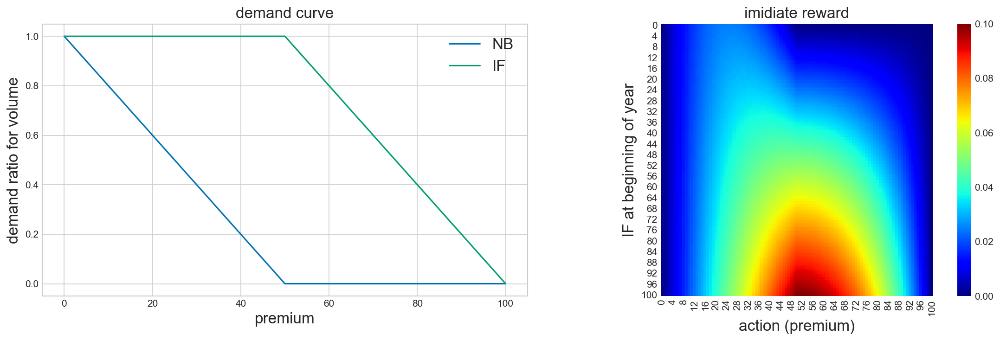

In [2]:
import Env_YRTRenewal
importlib.reload(Env_YRTRenewal)

env = Env_YRTRenewal.YRTRenewal(n_agents=1, term=10, 
                                expense_fixed=0/100, expense_variable=0/100)
env.show_demand()

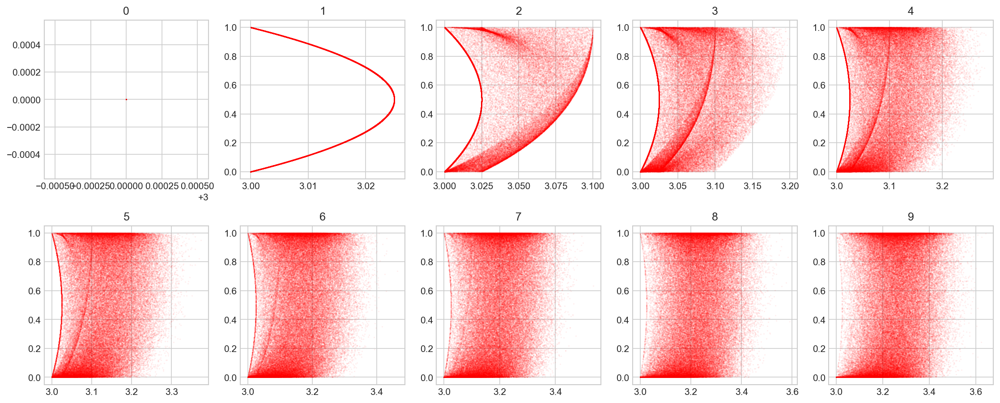

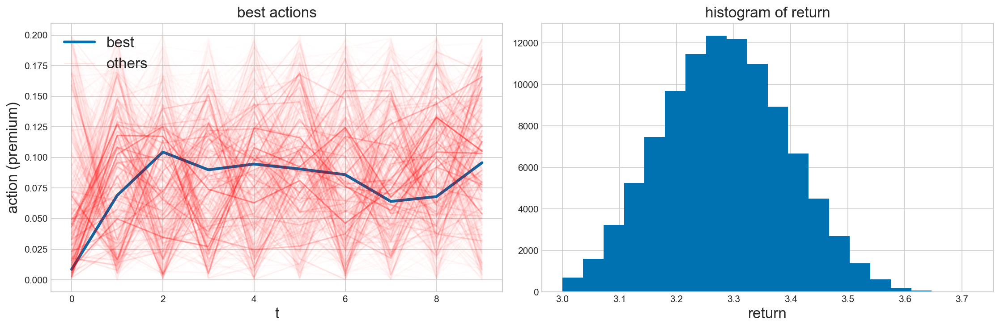

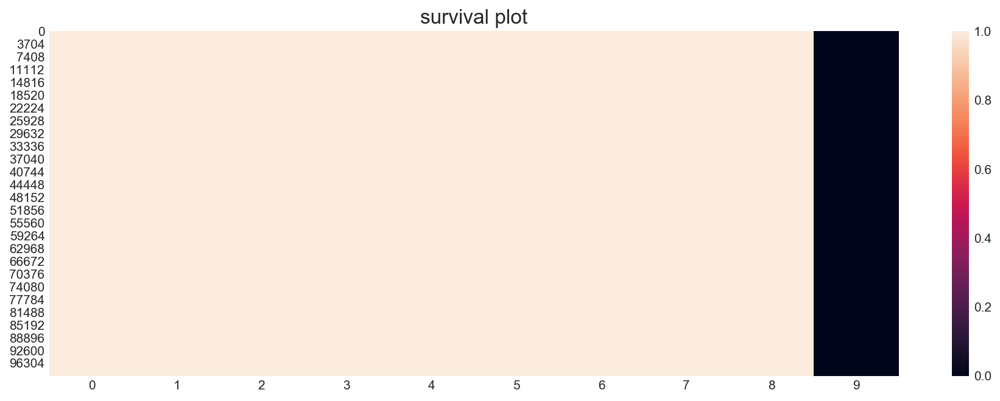

max(R) = 3.719, min(R) = 3.000, mean(R) = 3.284, std(R) = 0.110
survival ratio at end = 100.00%


In [3]:
env.show_simulation()

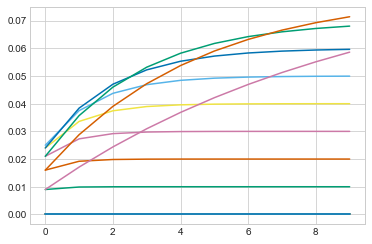

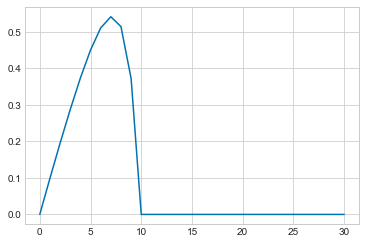

In [4]:
config = env.get_config()

X = []
Y = []
for a in np.arange(0, 31, 1):
    rewards = []
    for t in range(30):
        state_current = env.state()
        _, reward, _, done = env.step(np.array([[a,]]), verbose=False)
        rewards.append(reward[0][0])
        if done[0][0]==True:
            plt.plot(rewards, label=a)
            rewards = np.array(rewards).sum()
            X.append(a)
            Y.append(rewards)
            break

    #print('action=',a, 'reward=', rewards)
#plt.legend()
plt.show()

plt.plot(np.array(X), np.array(Y))
plt.show()


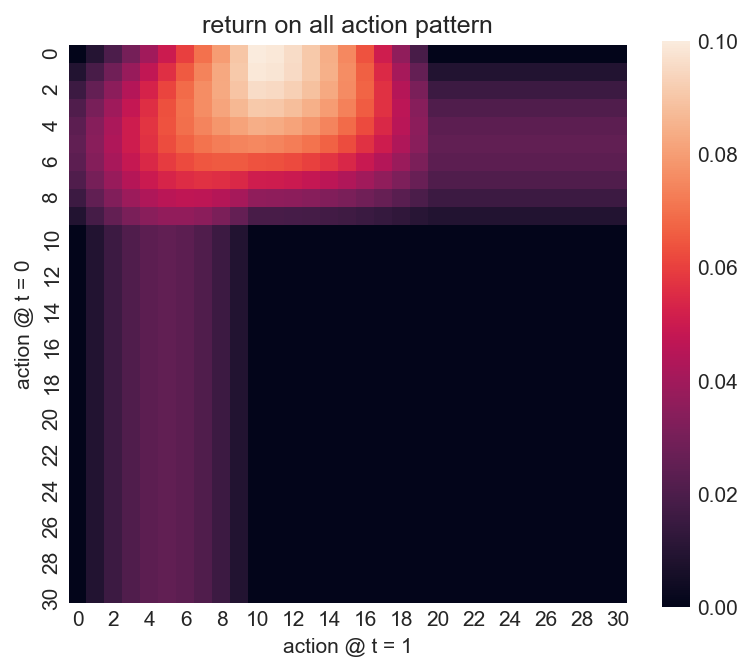

In [5]:
# 2期間の場合の利得の全探索．
env = Env_YRTRenewal.YRTRenewal(n_agents=1, term=2)
scores = np.zeros(shape=(31, 31))
for a1 in range(31):
    for a2 in range(31):
        env.reset()
        _, reward1, _, _ = env.step(np.array(a1))
        _, reward2, _, _ = env.step(np.array(a2))
        scores[a1, a2] = reward1 + reward2

fig, ax = plt.subplots(1, 1, figsize=(6, 5), dpi=150)
sns.heatmap(scores, ax=ax, square=True)
ax.set_title('return on all action pattern')
ax.set_xlabel('action @ t = 1')
ax.set_ylabel('action @ t = 0')

plt.show()

In [6]:
print(env.get_config())
print(env.mult_action)

{'n_agents': 1, 'term': 2, 'total_volume': 1, 'prm_min_NB': 0.0, 'prm_max_NB': 0.1, 'ratio_NB_max': 1.0, 'prm_min_IF': 0.1, 'prm_max_IF': 0.2, 'ratio_IF_max': 1.0, 'expense_fixed': 0.0, 'expense_variable': 0.0, 'interest': 0.0, 'initial_cash': 3.0}
0.01


---
## 2. Start testing on Agents

In [7]:
TERM = 10

In [8]:
n_trials = 5
n_steps = 10000
df = pd.DataFrame()

Instructions for updating:
Colocations handled automatically by placer.
lr=0.001, eps=0.1, boltzmann=False
start testing... :  2019-10-27 23:46:39.383347
start trial 1/5 trial...


  5%|▍         | 480/10000 [00:01<00:35, 267.77it/s]

Instructions for updating:
Use tf.cast instead.


100%|██████████| 10000/10000 [04:30<00:00, 37.00it/s]


start trial 2/5 trial...


100%|██████████| 10000/10000 [04:50<00:00, 34.42it/s]


start trial 3/5 trial...


100%|██████████| 10000/10000 [04:41<00:00, 35.57it/s]


start trial 4/5 trial...


100%|██████████| 10000/10000 [04:38<00:00, 35.89it/s]


start trial 5/5 trial...


100%|██████████| 10000/10000 [04:44<00:00, 35.17it/s]


end testing... :  2019-10-28 00:10:08.650892
loss and reward history


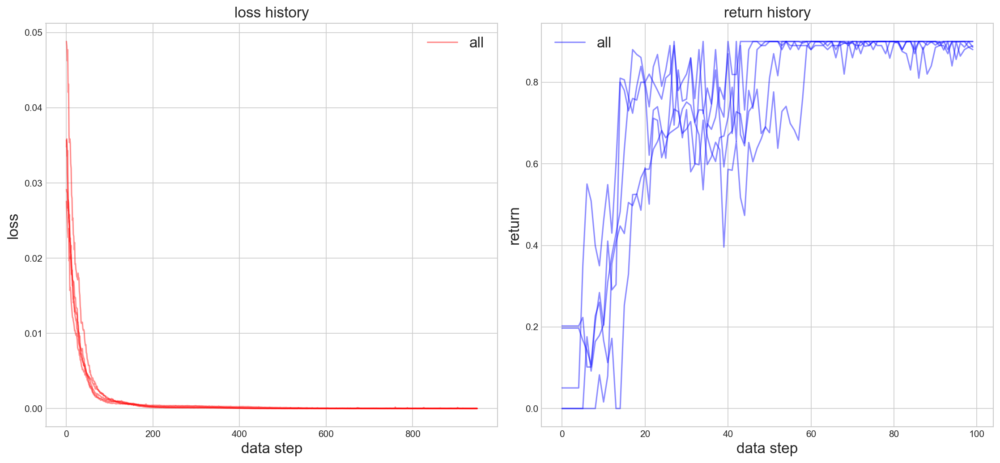

acquired action
action =  [0 0 0 0 0 0 0 0 0 0]
action =  [10 10 10 10 10 10 10 10 10 10]
action =  [10 10 10 10 10 10 10 10 10 10]
action =  [10 10 10 10 10 10 10 10 10 10]
action =  [10 10 10 10 10 10 10 10 10 10]
action =  [10 10 10 10 10 10 10 10 10 10]
action =  [10 10 10 10 10 10 10 10 10 10]
action =  [10 10 10 10 10 10 10 10 10 10]
action =  [9 9 9 9 9 9 9 9 9 9]
action =  [11 11 11 11 11 11 11 11 11 11]
return [0.889 0.889 0.889 0.889 0.889 0.889 0.889 0.889 0.889 0.889]
param distribution in model


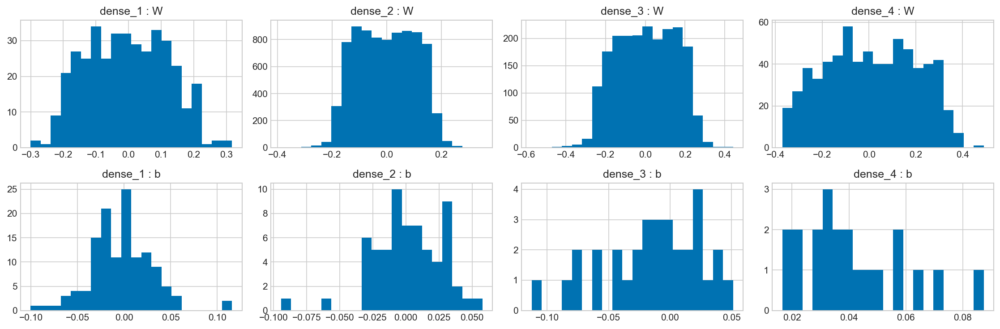

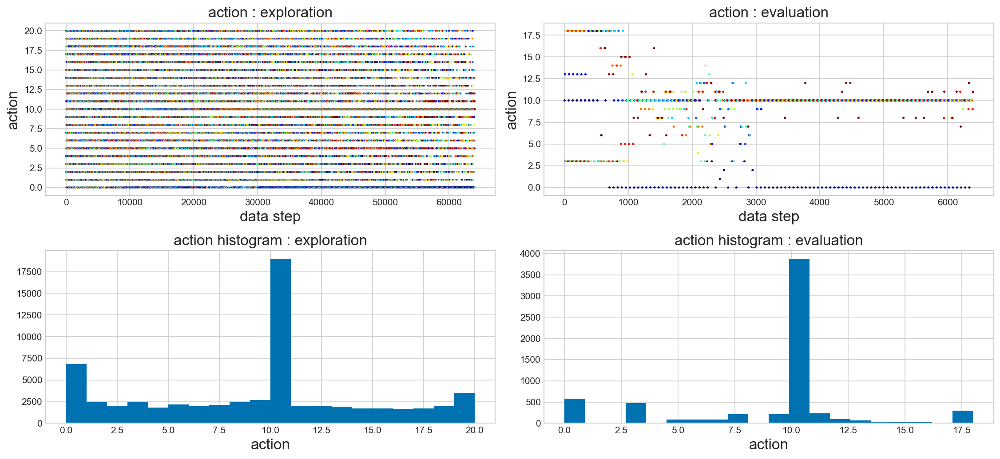

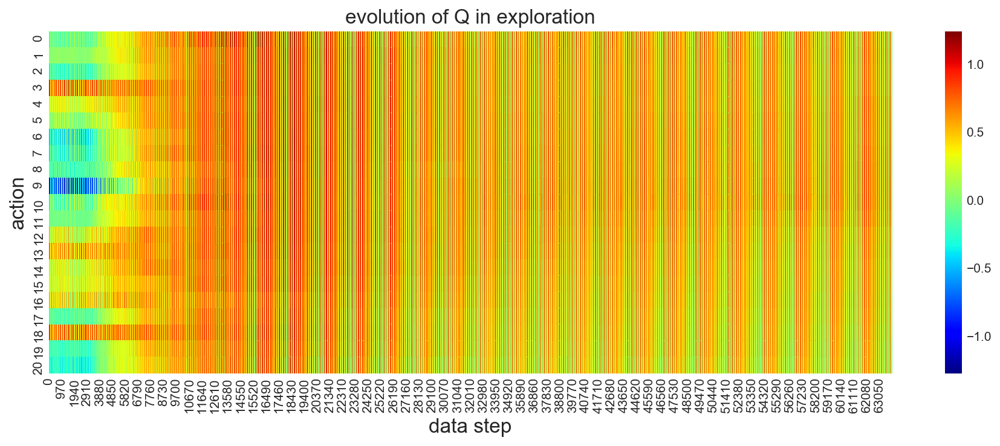

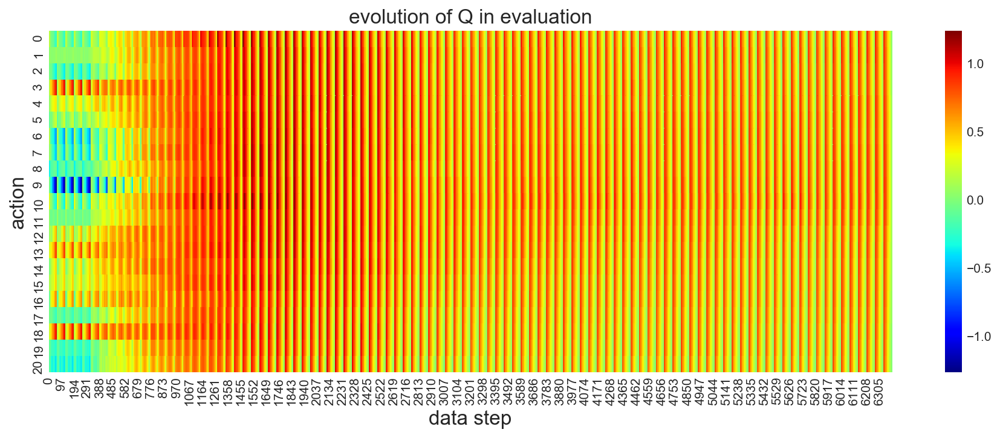

In [9]:
import DQN
import importlib
importlib.reload(DQN)  # original DRL code
from keras import optimizers

env = Env_YRTRenewal.YRTRenewal(term=TERM, n_agents=64)

model = DQN.gen_model(input_shapes=env.shapes(), n_outputs=21, \
                           hidden_dims=[128, 64, 32], reg_l1=0.0, reg_l2=0.0, 
                           duel=False, duel_value_dim=8, duel_advantage_dim=16, 
                           input_reg=False, input_min=0, input_max=1,
                           output_reg=False, output_min=0, output_max=1)

#df = pd.DataFrame()
for lr, eps, boltzmann in itertools.product([1e-3,], [1e-1,], [False,]):
    print('======================================================')
    print('lr={}, eps={}, boltzmann={}'
          .format(lr, eps, boltzmann))
    
    tester = DQN.Tester(env, model)
    #n_trials = 5
    #n_steps = 10000
    tester.test(n_trials=n_trials, n_steps=n_steps,
                training_interval=10, n_batches=10, batch_size=256, alpha=1.0, 
                target_update_interval=20, doubleQ=False,
                gamma=1.0, optimizer=optimizers.Adam(lr),
                epsilon_start=1.0, epsilon_end=eps, epsilon_interval=n_steps,
                boltzmann=boltzmann, 
                verbose=False, verbose_interval=100, evaluate_interval=100, 
                get_log=True)

    viz = DQN.Visualizer()
    viz.viz_action_history(tester.trainer, lambda x:x[0], 
                           cmap='jet', alpha=1.0, s=1.0)
    viz.viz_Q_history(tester.trainer)
    
    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['lr'] = lr
        #df_temp['eps'] = eps
        #df_temp['boltzmann'] = boltzmann
        df_temp['Agent'] = 'DQN'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

lr=0.01, n_advantages=10, mult_critic=1.0, mult_entropy=0.01
start testing... :  2019-10-28 00:10:25.451547
start 0/5 th trial...


100%|██████████| 10000/10000 [02:54<00:00, 57.33it/s]


start 1/5 th trial...


100%|██████████| 10000/10000 [02:57<00:00, 56.23it/s]


start 2/5 th trial...


100%|██████████| 10000/10000 [02:59<00:00, 55.63it/s]


start 3/5 th trial...


100%|██████████| 10000/10000 [03:01<00:00, 55.11it/s]


start 4/5 th trial...


100%|██████████| 10000/10000 [03:03<00:00, 54.48it/s]


end testing... :  2019-10-28 00:25:28.219792
loss and reward history


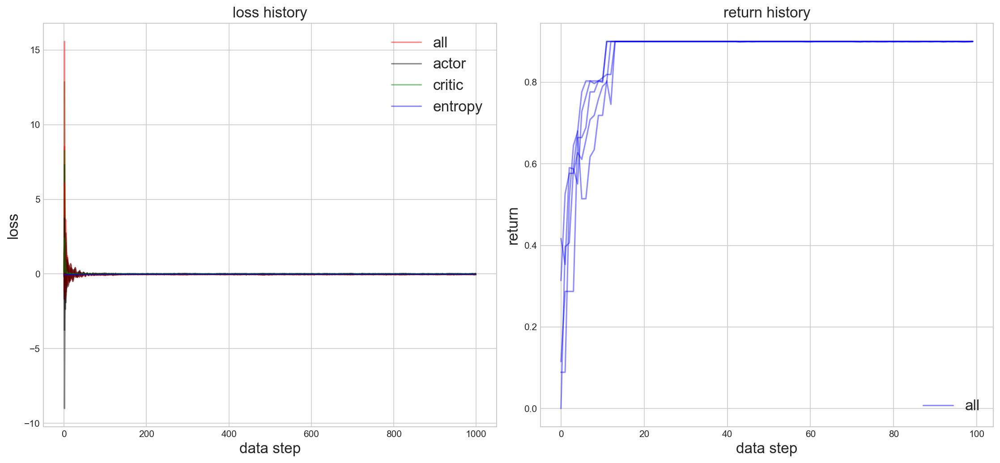

acquired action
action =  [0 0 0 0 0 0 0 0 0 0]
action =  [10 10 10 10 10 10 10 10 10 10]
action =  [10 10 10 10 10 10 10 10 10 10]
action =  [10 10 10 10 10 10 10 10 10 10]
action =  [10 10 10 10 10 10 10 10 10 10]
action =  [10 10 10 10 10 10 10 10 10 10]
action =  [10 10 10 10 10 10 10 10 10 10]
action =  [10 10 10 10 10 10 10 10 10 10]
action =  [10 10 10 10 10 10 10 10 10 10]
action =  [10 10 10 10 10 10 10 10 10 10]
return [0.9 0.9 0.9 0.9 0.9 0.9 0.9 0.9 0.9 0.9]
param distribution in model


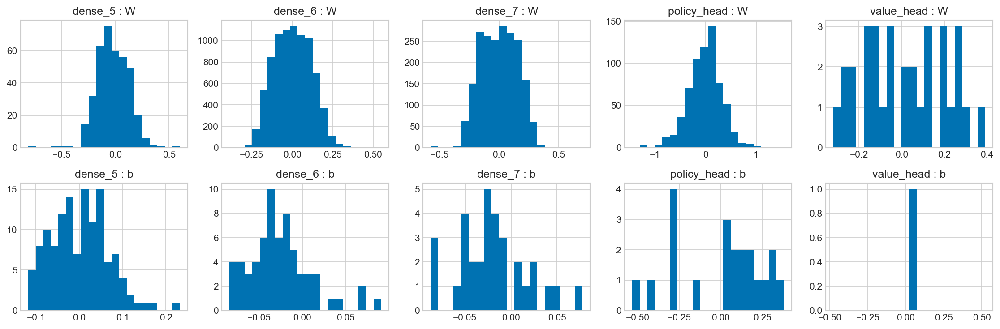

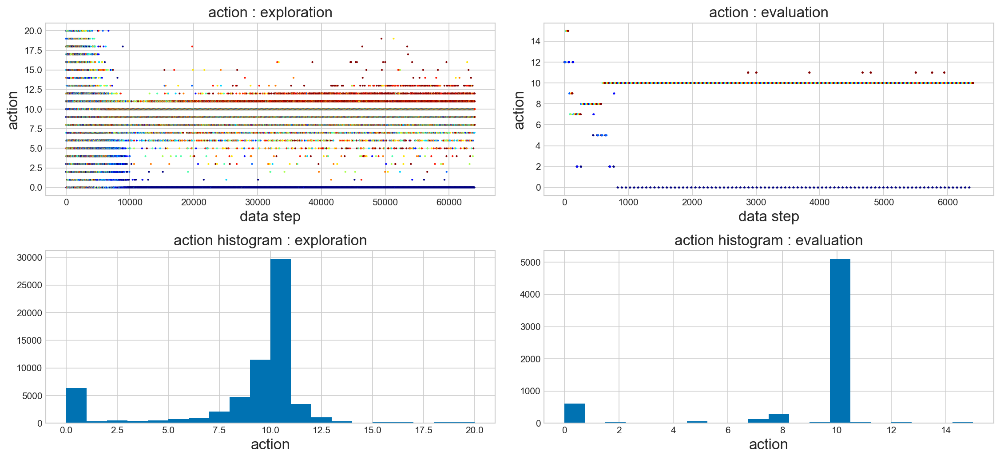

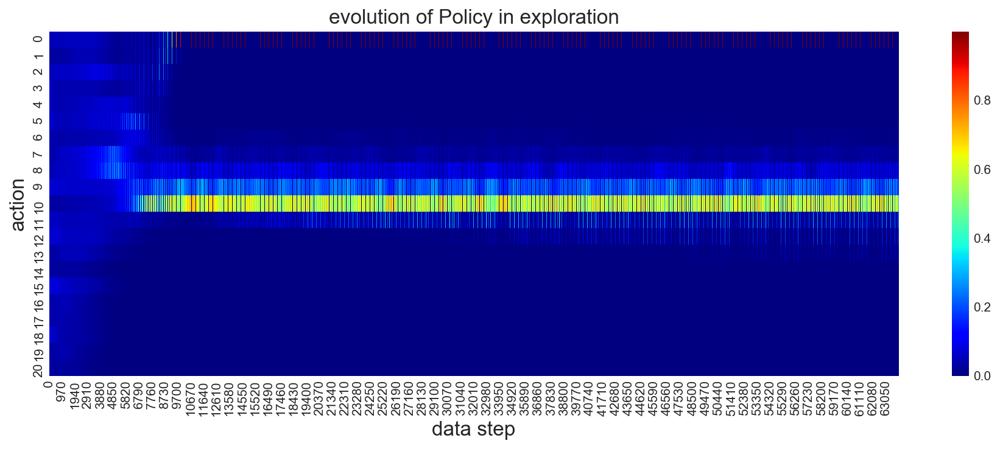

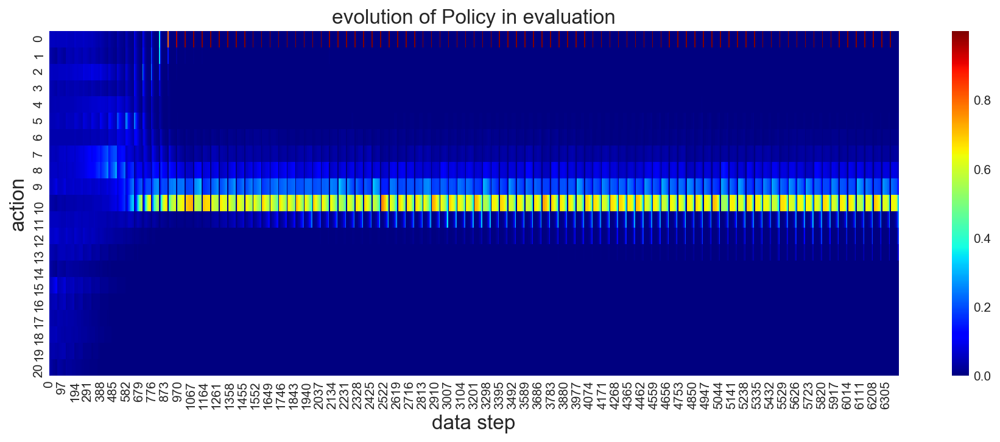

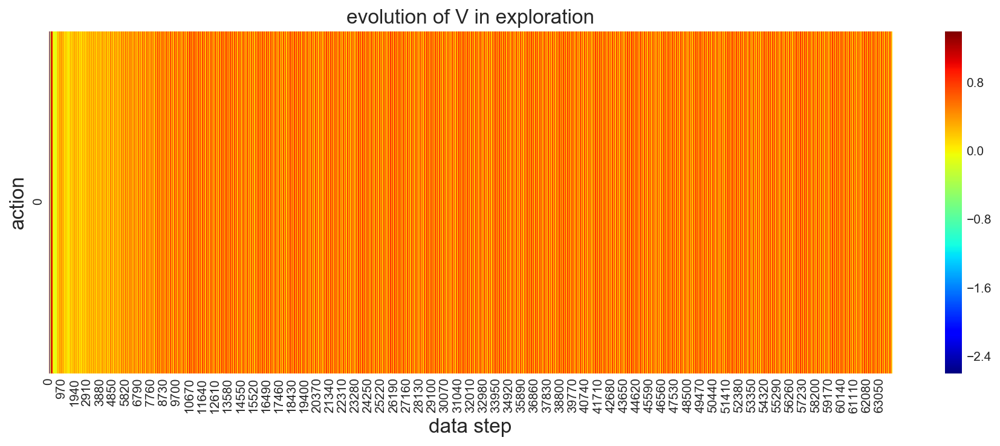

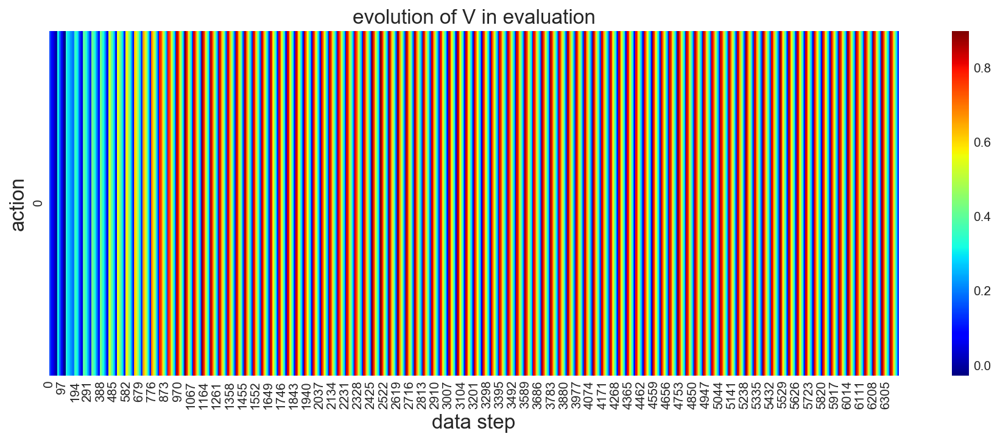

In [10]:
import A2C  # original DRL code
importlib.reload(A2C)  # original DRL code
from keras import optimizers

env = Env_YRTRenewal.YRTRenewal(term=TERM, n_agents=64)

model = A2C.gen_model(input_shapes=env.shapes(), n_outputs=21, 
                      hidden_dims=[128, 64, 32])

#df = pd.DataFrame()
for lr, n_advantages, mult_critic, mult_entropy in itertools.product(
    [1e-2,], [10,], [1.0,], [0.01,]):
    print('======================================================')
    print('lr={}, n_advantages={}, mult_critic={}, mult_entropy={}'
          .format(lr, n_advantages, mult_critic, mult_entropy))
    
    tester = A2C.Tester(env, model)
    #n_trials = 5
    #n_steps = 10000
    tester.test(n_trials=n_trials, n_steps=n_steps, n_advantages=n_advantages,
               gamma=1.0, optimizer=optimizers.Adam(lr=lr),
               mult_actor=1.0, mult_critic=mult_critic, mult_entropy=mult_entropy,
               verbose=False, verbose_interval=100, evaluate_interval=100, 
               get_log=True)

    viz = A2C.Visualizer()
    viz.viz_action_history(tester.trainer, lambda x:x[0], 
                           cmap='jet', alpha=1.0, s=1.0)
    viz.viz_P_history(tester.trainer)
    viz.viz_V_history(tester.trainer)

    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['lr'] = lr
        #f_temp['n_advantages'] = n_advantages
        #df_temp['mult_critic'] = mult_critic
        #df_temp['mult_entropy'] = mult_entropy
        df_temp['Agent'] = 'A2C_discrete'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

In [11]:
# setting for continuous
env = Env_YRTRenewal.YRTRenewal(term=TERM, mult_action=1, n_agents=64)
config = env.get_config()

lr=0.01, n_advantages=10, mult_critic=0.1, mult_entropy=0.001
start testing... :  2019-10-28 00:25:53.936302
start 0/5 th trial...


100%|██████████| 10000/10000 [02:01<00:00, 82.45it/s]


start 1/5 th trial...


100%|██████████| 10000/10000 [02:07<00:00, 78.20it/s]


start 2/5 th trial...


100%|██████████| 10000/10000 [02:20<00:00, 71.17it/s]


start 3/5 th trial...


100%|██████████| 10000/10000 [02:08<00:00, 77.63it/s]


start 4/5 th trial...


100%|██████████| 10000/10000 [02:11<00:00, 75.98it/s]


end testing... :  2019-10-28 00:36:52.878463
loss and reward history


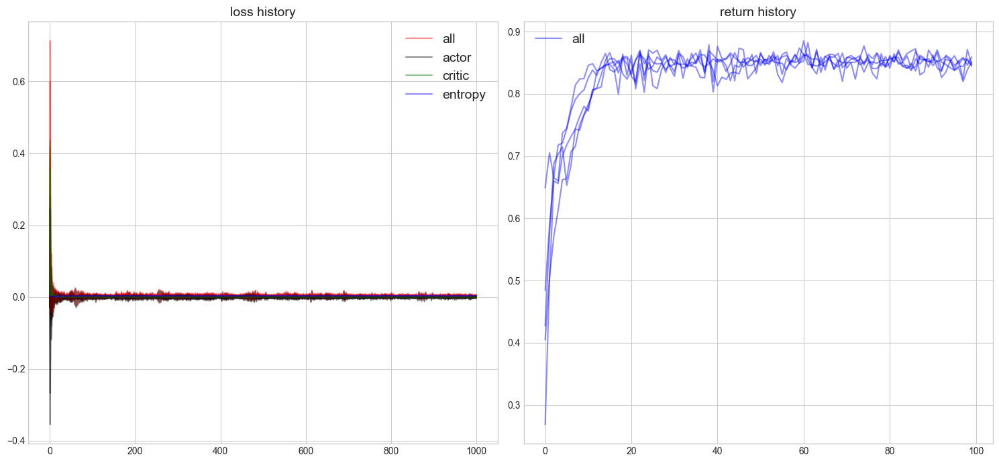

acquired action
action =  [3.1e-05 3.1e-05 3.1e-05 3.1e-05 3.1e-05 3.1e-05 3.1e-05 3.1e-05 3.1e-05
 3.1e-05]
action =  [0.093 0.093 0.093 0.093 0.093 0.093 0.093 0.093 0.093 0.093]
action =  [0.093 0.093 0.093 0.093 0.093 0.093 0.093 0.093 0.093 0.093]
action =  [0.093 0.093 0.093 0.093 0.093 0.093 0.093 0.093 0.093 0.093]
action =  [0.092 0.092 0.092 0.092 0.092 0.092 0.092 0.092 0.092 0.092]
action =  [0.092 0.092 0.092 0.092 0.092 0.092 0.092 0.092 0.092 0.092]
action =  [0.092 0.092 0.092 0.092 0.092 0.092 0.092 0.092 0.092 0.092]
action =  [0.093 0.093 0.093 0.093 0.093 0.093 0.093 0.093 0.093 0.093]
action =  [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
action =  [0.107 0.107 0.107 0.107 0.107 0.107 0.107 0.107 0.107 0.107]
return [0.848 0.848 0.848 0.848 0.848 0.848 0.848 0.848 0.848 0.848]
param distribution in model


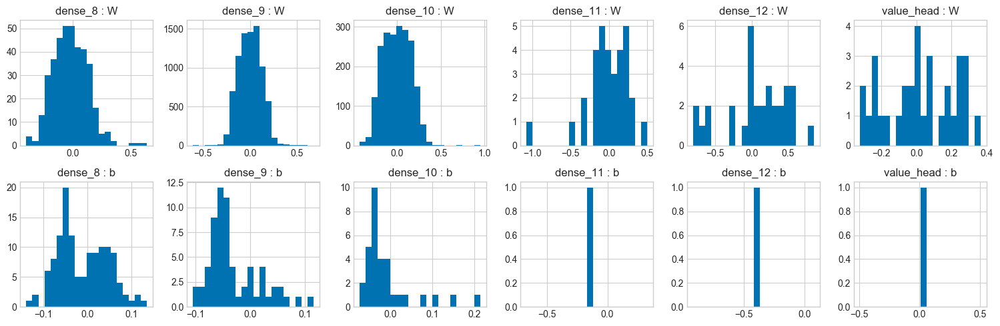

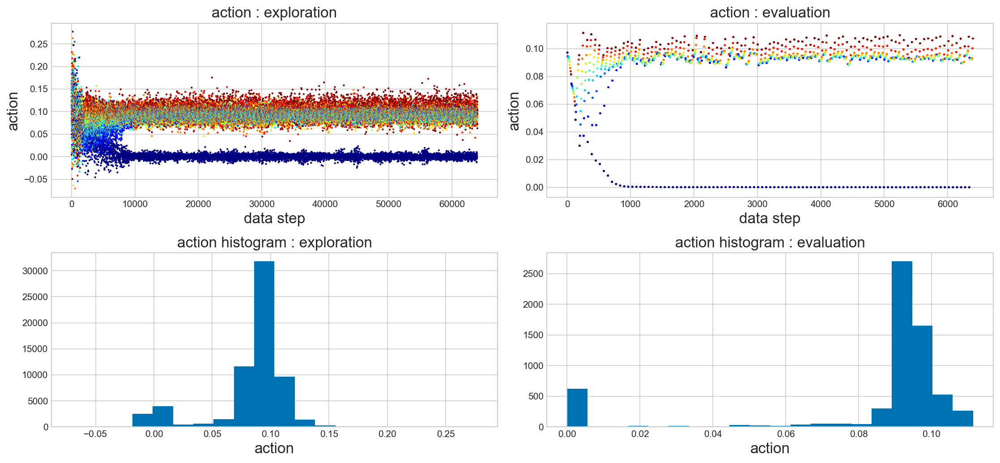

In [12]:
import importlib
import A2C_continuous
importlib.reload(A2C_continuous)  # original DRL code

from keras import optimizers

config = env.get_config()

mu_min = min(config['prm_min_NB'], config['prm_min_IF'])
mu_max = max(config['prm_max_NB'], config['prm_max_IF'])
sigma_max = (mu_max - mu_min) / 3

model = A2C_continuous.gen_model(input_shapes=env.shapes(), n_outputs=1, \
                                 hidden_dims=[128, 64, 32], reg_l1=0.0, reg_l2=0.0, \
                                mu_min=mu_min, mu_max=mu_max, 
                                va_min=(0.001)**2, va_max=sigma_max**2, 
                                input_reg=False, input_min=0, input_max=1)

#df = pd.DataFrame()
for lr, n_advantages, mult_critic, mult_entropy in itertools.product(
    [1e-2,], [10,], [0.1,], [0.001,]):
    print('======================================================')
    print('lr={}, n_advantages={}, mult_critic={}, mult_entropy={}'
          .format(lr, n_advantages, mult_critic, mult_entropy))
    
    tester = A2C_continuous.Tester(env, model, val_min=mu_min-3*sigma_max, val_max=mu_max+3*sigma_max)
    #n_trials = 5
    #n_steps = 10000
    tester.test(n_trials=n_trials, n_steps=n_steps, n_advantages=n_advantages,
               gamma=1.0, optimizer=optimizers.Adam(lr=lr),
               mult_actor=0.1, mult_critic=mult_critic, mult_entropy=mult_entropy,
               verbose=False, verbose_interval=100, evaluate_interval=100, 
               get_log=True)

    viz = A2C_continuous.Visualizer()
    viz.viz_action_history(tester.trainer, state_valuation=lambda x:x[0], action_valuation=lambda x:x, 
                           cmap='jet', alpha=1.0, s=1.0)

    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['lr'] = lr
        #df_temp['n_advantages'] = n_advantages
        #df_temp['mult_critic'] = mult_critic
        #df_temp['mult_entropy'] = mult_entropy
        df_temp['Agent'] = 'A2C_continuous'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

lr_p=0.0001, lr_v=0.001, boltzmann=False, sigma_end=1.0, tau_end=10
start testing... :  2019-10-28 00:37:04.940956
start 0/5 th trial...


100%|██████████| 10000/10000 [15:19<00:00, 10.87it/s]


start 1/5 th trial...


100%|██████████| 10000/10000 [15:42<00:00, 10.61it/s]


start 2/5 th trial...


100%|██████████| 10000/10000 [16:09<00:00, 10.32it/s]


start 3/5 th trial...


100%|██████████| 10000/10000 [17:06<00:00,  9.74it/s]


start 4/5 th trial...


100%|██████████| 10000/10000 [16:38<00:00, 10.01it/s]


end testing... :  2019-10-28 01:58:40.880452
loss and reward history


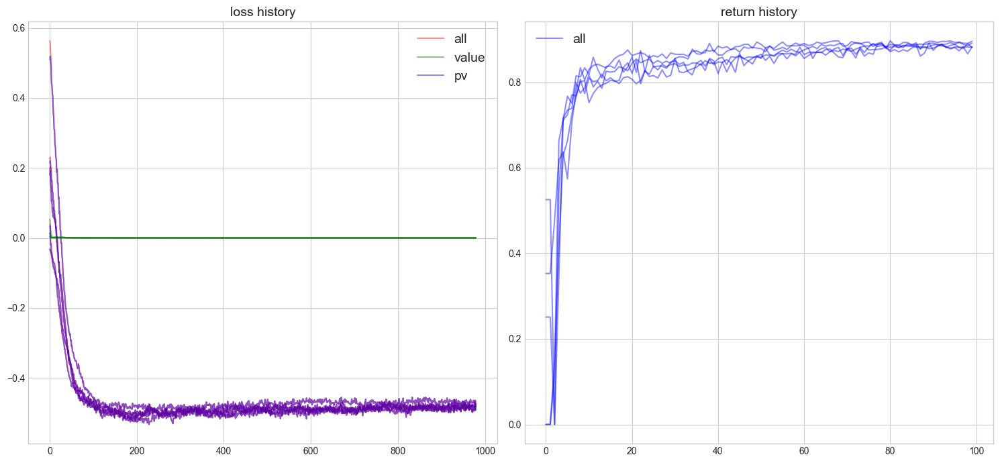

acquired action
action =  [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
action =  [0.096 0.096 0.096 0.096 0.096 0.096 0.096 0.096 0.096 0.096]
action =  [0.096 0.096 0.096 0.096 0.096 0.096 0.096 0.096 0.096 0.096]
action =  [0.097 0.097 0.097 0.097 0.097 0.097 0.097 0.097 0.097 0.097]
action =  [0.097 0.097 0.097 0.097 0.097 0.097 0.097 0.097 0.097 0.097]
action =  [0.098 0.098 0.098 0.098 0.098 0.098 0.098 0.098 0.098 0.098]
action =  [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
action =  [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
action =  [0.102 0.102 0.102 0.102 0.102 0.102 0.102 0.102 0.102 0.102]
action =  [0.104 0.104 0.104 0.104 0.104 0.104 0.104 0.104 0.104 0.104]
return [0.882 0.882 0.882 0.882 0.882 0.882 0.882 0.882 0.882 0.882]
param distribution in model_policy


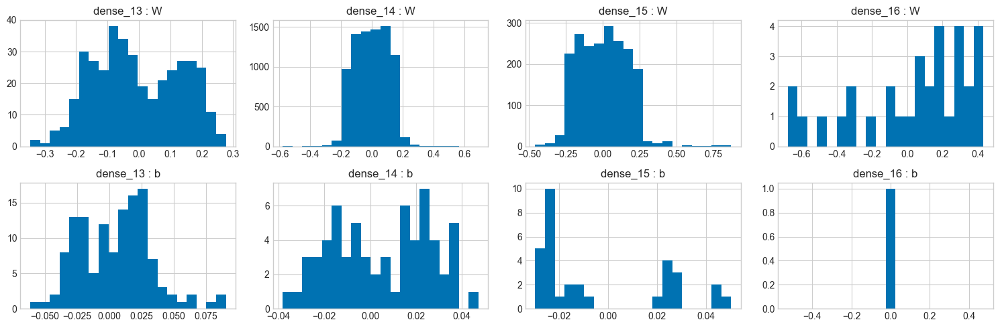

param distribution in model_value


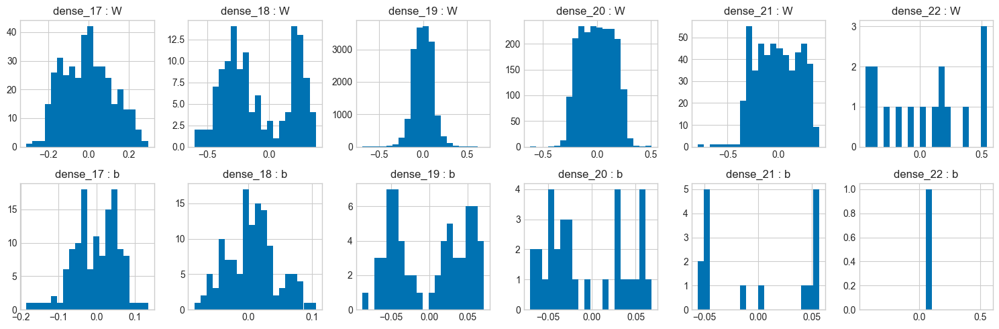

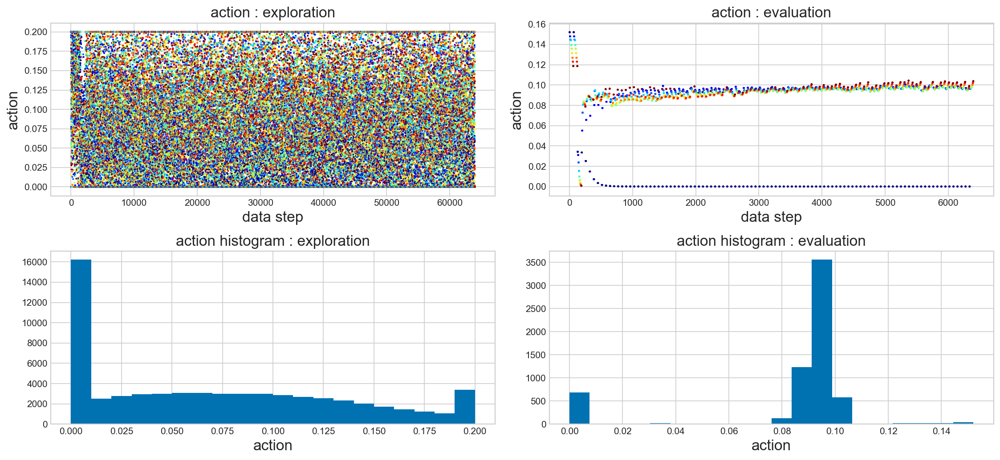

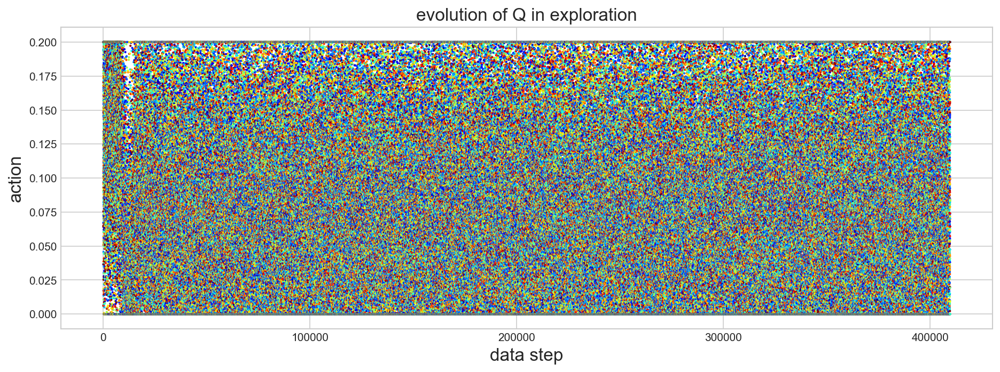

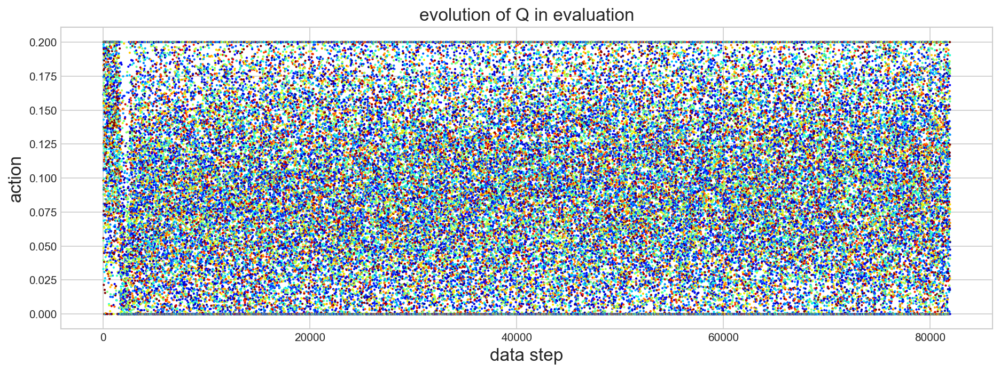

In [13]:
import DDPG  # original DRL code
importlib.reload(DDPG)
from keras import optimizers

action_min = config['prm_min_NB']
action_max = config['prm_max_IF']
sigma_max = (action_max - action_min) / 3

model_policy = DDPG.gen_model_policy(state_shapes=env.shapes(), n_actions=1, 
                                     hidden_dims=[128, 64, 32], 
                                     reg_l1=0.0, reg_l2=0.0, 
                                     action_min=action_min, action_max=action_max, 
                                     batch_norm_input=False, 
                                     state_reg=False, state_min=0, state_max=10)

model_value = DDPG.gen_model_value(state_shapes=env.shapes(), n_actions=1, \
                                   hidden_action_dims=[128,], 
                                   hidden_state_dims=[128,],
                                   hidden_dims=[64, 32, 16],
                                   reg_l1=0.0, reg_l2=0.0,
                                   batch_norm_state_hidden=False)


#df = pd.DataFrame()
for lr_p, lr_v, boltzmann, sigma_end, tau_end in itertools.product(
    [1e-4,], [1e-3,], [False,], [1.0,], [10,]):
    print('======================================================')
    print('lr_p={}, lr_v={}, boltzmann={}, sigma_end={}, tau_end={}'
          .format(lr_p, lr_v, boltzmann, sigma_end, tau_end))
    
    tester = DDPG.Tester(env, model_policy, model_value, val_min=action_min, val_max=action_max)
    #n_trials = 5
    #n_steps = 10000
    tester.test(n_trials=n_trials,
                gamma=1.0,
                n_steps=n_steps, training_interval=10, n_batches=10, batch_size=256,
                target_update_interval_policy=20, target_update_interval_value=20,
                tau_policy=0.5, tau_value=0.5,
                optimizer_pv=optimizers.Adam(lr=lr_p), optimizer_value=optimizers.Adam(lr=lr_v),
                sigma_start=sigma_max, sigma_end=sigma_max*sigma_end, sigma_interval=n_steps,
                boltzmann=boltzmann, tau_start=10, tau_end=tau_end, tau_interval=n_steps, n_samples=64,
                verbose=False, verbose_interval=100, evaluate_interval=100, 
                wampup_steps=200, 
                get_log=True)

    viz = DDPG.Visualizer()
    viz.viz_action_history(tester.trainer, state_valuation=lambda x:x[0], action_valuation=lambda x:x, 
                               cmap='jet', alpha=1.0, s=1.0)
    viz.viz_Q_history(trainer=tester.trainer, 
                      state_valuation=lambda x:np.ravel(x[0][:, 0]), 
                      action_valuation=lambda x:np.ravel(x[:, 0]),
                      data_span_exp=100, data_span_eva=100,)
    
    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['lr_p'] = lr_p
        #df_temp['lr_v'] = lr_v
        #df_temp['boltzmann'] = boltzmann
        #df_temp['sigma_end'] = sigma_end
        #df_temp['tau_end'] = tau_end
        df_temp['Agent'] = 'DDPG'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

lr=0.0001, sigma_end=0.5
start testing... :  2019-10-28 01:59:12.241901
start trial 0/5 trial...


100%|██████████| 10000/10000 [03:11<00:00, 52.19it/s]


start trial 1/5 trial...


100%|██████████| 10000/10000 [03:10<00:00, 52.40it/s]


start trial 2/5 trial...


100%|██████████| 10000/10000 [03:12<00:00, 51.81it/s]


start trial 3/5 trial...


100%|██████████| 10000/10000 [03:15<00:00, 51.23it/s]


start trial 4/5 trial...


100%|██████████| 10000/10000 [03:18<00:00, 50.42it/s]


end testing... :  2019-10-28 02:15:39.826223
loss and return history


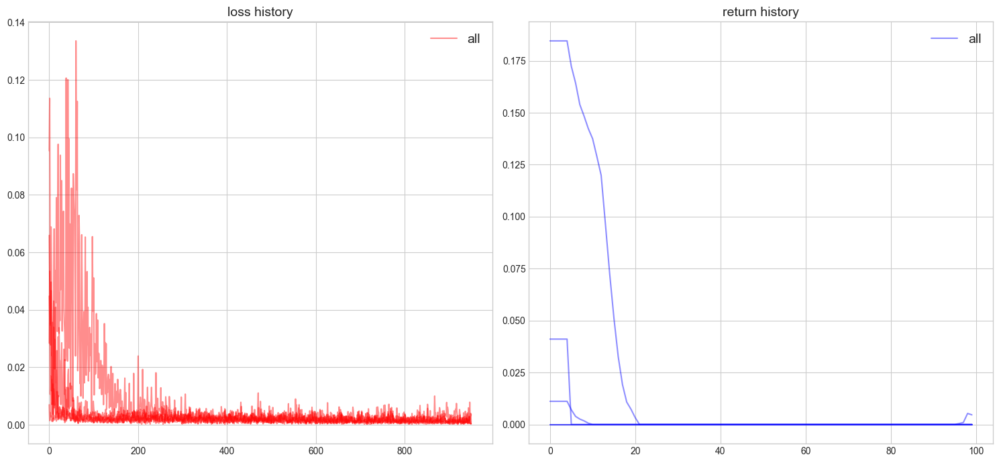

acquired action
action =  [0.119 0.119 0.119 0.119 0.119 0.119 0.119 0.119 0.119 0.119]
action =  [0.115 0.115 0.115 0.115 0.115 0.115 0.115 0.115 0.115 0.115]
action =  [0.114 0.114 0.114 0.114 0.114 0.114 0.114 0.114 0.114 0.114]
action =  [0.113 0.113 0.113 0.113 0.113 0.113 0.113 0.113 0.113 0.113]
action =  [0.114 0.114 0.114 0.114 0.114 0.114 0.114 0.114 0.114 0.114]
action =  [0.116 0.116 0.116 0.116 0.116 0.116 0.116 0.116 0.116 0.116]
action =  [0.117 0.117 0.117 0.117 0.117 0.117 0.117 0.117 0.117 0.117]
action =  [0.119 0.119 0.119 0.119 0.119 0.119 0.119 0.119 0.119 0.119]
action =  [0.12 0.12 0.12 0.12 0.12 0.12 0.12 0.12 0.12 0.12]
action =  [0.121 0.121 0.121 0.121 0.121 0.121 0.121 0.121 0.121 0.121]
return [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
param distribution in model


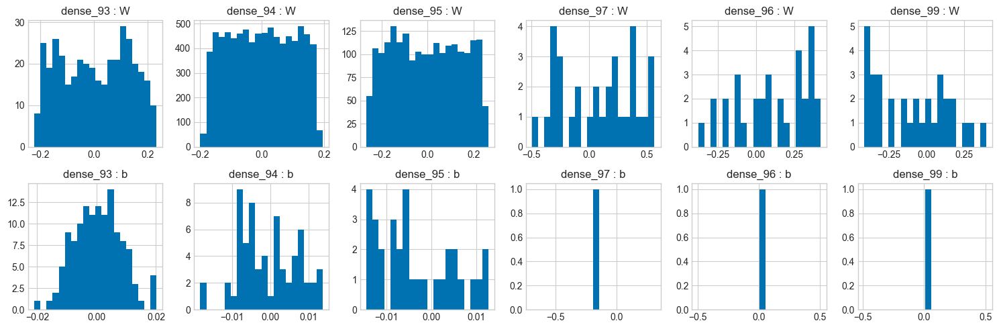

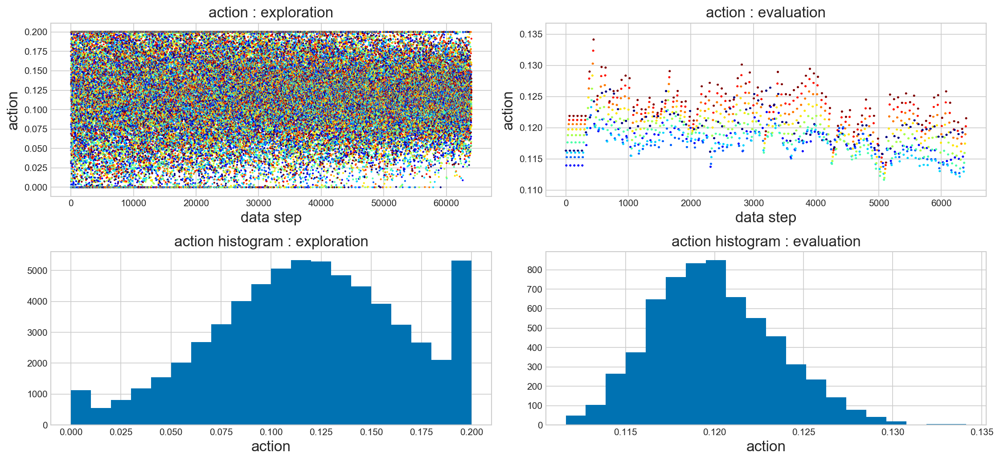

In [14]:
import NAF
importlib.reload(NAF)

from keras import optimizers
np.set_printoptions(precision=3)  # 数値桁数を指定．

action_min = config['prm_min_NB']
action_max = config['prm_max_IF']
sigma = (action_max - action_min) / 3

model_gen_func = lambda : NAF.gen_model(input_shapes=env.shapes(), n_actions=1, 
                     hidden_dims=[128, 64, 32], reg_l1=0.0, reg_l2=0.0, 
                     input_reg=False, input_min=0, input_max=10, 
                     action_reg=True, action_min=action_min, action_max=action_max,
                     value_reg=False, value_min=0, value_max=10)
model = model_gen_func()

#df = pd.DataFrame()
for lr, sigma_end in itertools.product(
    [1e-4,], [0.5,]):
    print('======================================================')
    print('lr={}, sigma_end={}'
          .format(lr, sigma_end))
    
    tester = NAF.Tester(env, model, val_min=action_min, val_max=action_max, 
                        model_gen_func=model_gen_func)
    #n_trials = 5
    #n_steps = 10000
    tester.test(n_trials=n_trials, 
                n_steps=n_steps, training_interval=10, n_batches=10, batch_size=128,
                alpha=1.0, target_update_interval=100,
                gamma=1.0,
                optimizer=optimizers.Adam(lr), 
                sigma_start=sigma, sigma_end=sigma * sigma_end, sigma_interval=n_steps,
                verbose=False, verbose_interval=100, evaluate_interval=100, 
                get_log=True)
    
    viz = NAF.Visualizer()
    viz.viz_action_history(tester.trainer, state_valuation=lambda x:x[0], action_valuation=lambda x:x, 
                           cmap='jet', alpha=1.0, s=1.0)
    
    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['lr'] = lr
        #df_temp['sigma_end'] = sigma_end
        df_temp['Agent'] = 'NAF'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

lr=0.001, mult_critic=1.0, mult_entropy=1e-05
start testing... :  2019-10-28 02:15:49.404445
start 0/5 th trial...


100%|██████████| 10000/10000 [05:12<00:00, 32.04it/s]


start 1/5 th trial...


100%|██████████| 10000/10000 [05:15<00:00, 31.69it/s]


start 2/5 th trial...


100%|██████████| 10000/10000 [05:16<00:00, 31.61it/s]


start 3/5 th trial...


100%|██████████| 10000/10000 [05:17<00:00, 31.46it/s]


start 4/5 th trial...


100%|██████████| 10000/10000 [05:21<00:00, 31.15it/s]


end testing... :  2019-10-28 02:42:33.335484
loss and reward history


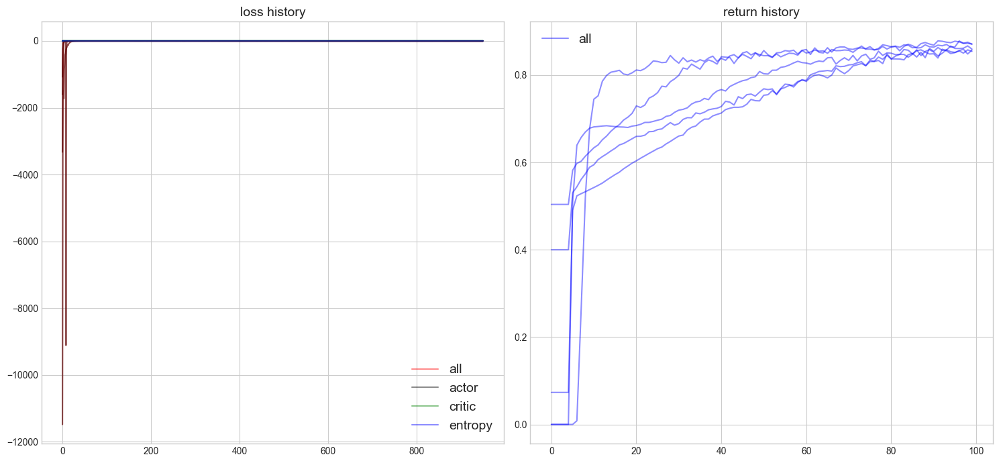

acquired action
action =  [6.756e-05 6.756e-05 6.756e-05 6.756e-05 6.756e-05 6.756e-05 6.756e-05
 6.756e-05 6.756e-05 6.756e-05]
action =  [0.095 0.095 0.095 0.095 0.095 0.095 0.095 0.095 0.095 0.095]
action =  [0.095 0.095 0.095 0.095 0.095 0.095 0.095 0.095 0.095 0.095]
action =  [0.095 0.095 0.095 0.095 0.095 0.095 0.095 0.095 0.095 0.095]
action =  [0.096 0.096 0.096 0.096 0.096 0.096 0.096 0.096 0.096 0.096]
action =  [0.096 0.096 0.096 0.096 0.096 0.096 0.096 0.096 0.096 0.096]
action =  [0.097 0.097 0.097 0.097 0.097 0.097 0.097 0.097 0.097 0.097]
action =  [0.098 0.098 0.098 0.098 0.098 0.098 0.098 0.098 0.098 0.098]
action =  [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
action =  [0.104 0.104 0.104 0.104 0.104 0.104 0.104 0.104 0.104 0.104]
return [0.871 0.871 0.871 0.871 0.871 0.871 0.871 0.871 0.871 0.871]
param distribution in model


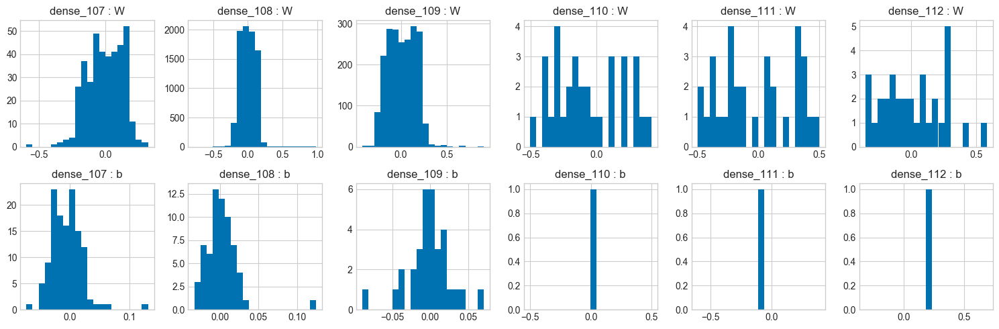

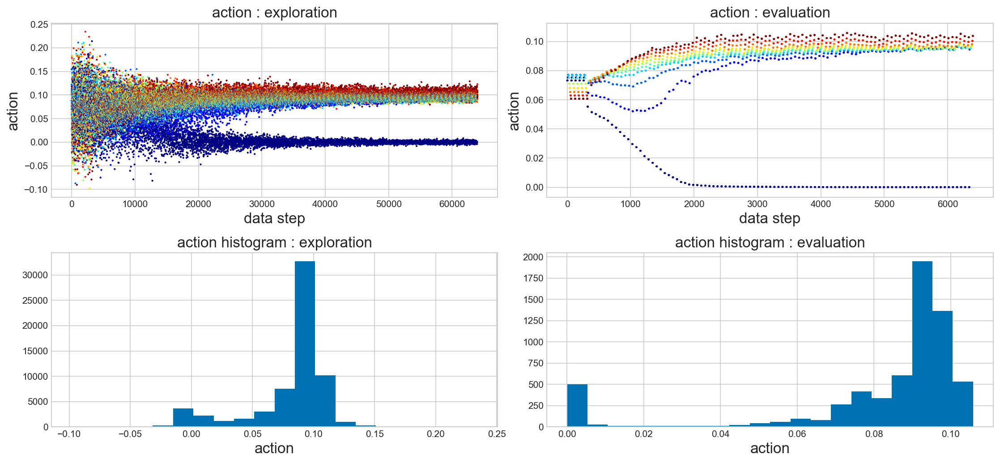

In [15]:
import AWR
importlib.reload(AWR)  # original DRL code

from keras import optimizers

config = env.get_config()

mu_min = min(config['prm_min_NB'], config['prm_min_IF'])
mu_max = max(config['prm_max_NB'], config['prm_max_IF'])
sigma_max = (mu_max - mu_min) / 3

model = AWR.gen_model(input_shapes=env.shapes(), n_outputs=1, \
                      hidden_dims=[128, 64, 32], reg_l1=0.0, reg_l2=0.0, \
                      state_reg=False, state_min=-1.0, state_max=1.0,
                      action_reg=True, 
                      action_min=mu_min, action_max=mu_max, 
                      action_sigma_min=0.0001, action_sigma_max=sigma_max, 
                      value_reg=False, value_min=0, value_max=1)

#df = pd.DataFrame()
for lr, mult_critic, mult_entropy in itertools.product(
    [1e-3,], [1.0,], [1e-5,]):
    print('======================================================')
    print('lr={}, mult_critic={}, mult_entropy={}'
          .format(lr, mult_critic, mult_entropy))
    
    tester = AWR.Tester(env, model, 
                        action_min=mu_min-3*sigma_max, 
                        action_max=mu_max+3*sigma_max)
    #n_trials = 1
    #n_steps = 10000
    tester.test(n_trials=n_trials, n_steps=n_steps, 
                training_interval=10, n_batches=10, batch_size=256,
                buf_alpha=0.5, buf_beta=0.5, buf_mode='rank',
                gamma=1.0, 
                optimizer=optimizers.Adam(lr=lr),
                mult_actor=1.0, mult_critic=mult_critic, mult_entropy=mult_entropy, mult_beta=0.1, 
                verbose=False, verbose_interval=100, evaluate_interval=100, 
                get_log=True)

    viz = AWR.Visualizer()
    viz.viz_action_history(tester.trainer, state_valuation=lambda x:x[0], action_valuation=lambda x:x, 
                           cmap='jet', alpha=1.0, s=1.0)

    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['lr'] = lr
        #df_temp['mult_critic'] = mult_critic
        #df_temp['mult_entropy'] = mult_entropy
        df_temp['Agent'] = 'AWR'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

  0%|          | 0/1000 [00:00<?, ?it/s]

lr=0.1, eps=0.1
start testing... :  2019-10-28 02:42:43.219506
start trial 0/5 trial...


100%|██████████| 1000/1000 [2:11:07<00:00,  7.87s/it] 


start trial 1/5 trial...


100%|██████████| 1000/1000 [2:11:54<00:00,  7.91s/it] 


start trial 2/5 trial...


100%|██████████| 1000/1000 [2:17:17<00:00,  8.24s/it] 


start trial 3/5 trial...


100%|██████████| 1000/1000 [2:21:44<00:00,  8.50s/it] 


start trial 4/5 trial...


100%|██████████| 1000/1000 [2:22:01<00:00,  8.52s/it] 


end testing... :  2019-10-28 14:11:07.115878
loss and reward history


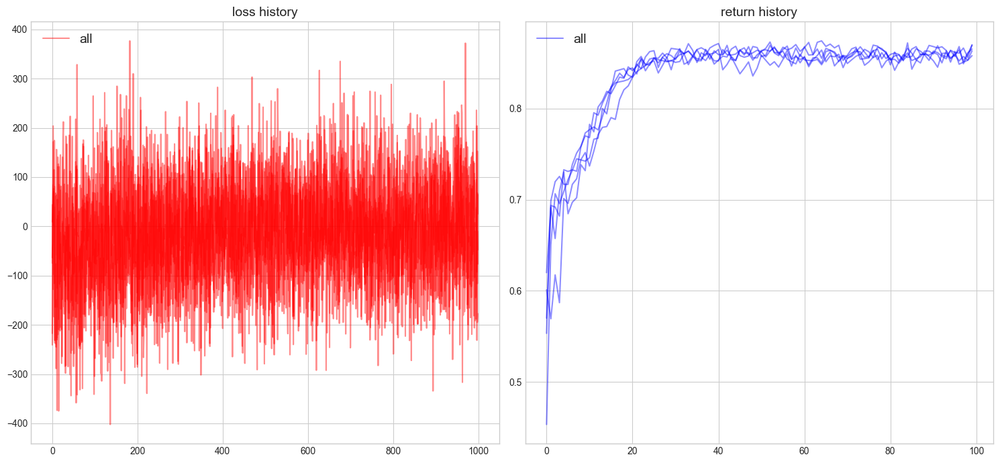

acquired action
action =  [1.296e-05 1.296e-05 1.296e-05 1.296e-05 1.296e-05 1.296e-05 1.296e-05
 1.296e-05 1.296e-05 1.296e-05]
action =  [0.093 0.093 0.093 0.093 0.093 0.093 0.093 0.093 0.093 0.093]
action =  [0.094 0.094 0.094 0.094 0.094 0.094 0.094 0.094 0.094 0.094]
action =  [0.095 0.095 0.095 0.095 0.095 0.095 0.095 0.095 0.095 0.095]
action =  [0.096 0.096 0.096 0.096 0.096 0.096 0.096 0.096 0.096 0.096]
action =  [0.097 0.097 0.097 0.097 0.097 0.097 0.097 0.097 0.097 0.097]
action =  [0.098 0.098 0.098 0.098 0.098 0.098 0.098 0.098 0.098 0.098]
action =  [0.098 0.098 0.098 0.098 0.098 0.098 0.098 0.098 0.098 0.098]
action =  [0.099 0.099 0.099 0.099 0.099 0.099 0.099 0.099 0.099 0.099]
action =  [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
total_reward [0.87 0.87 0.87 0.87 0.87 0.87 0.87 0.87 0.87 0.87]
param distribution in model


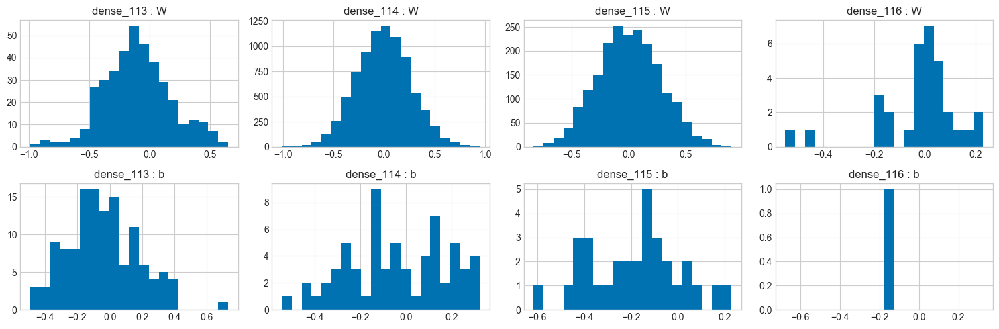

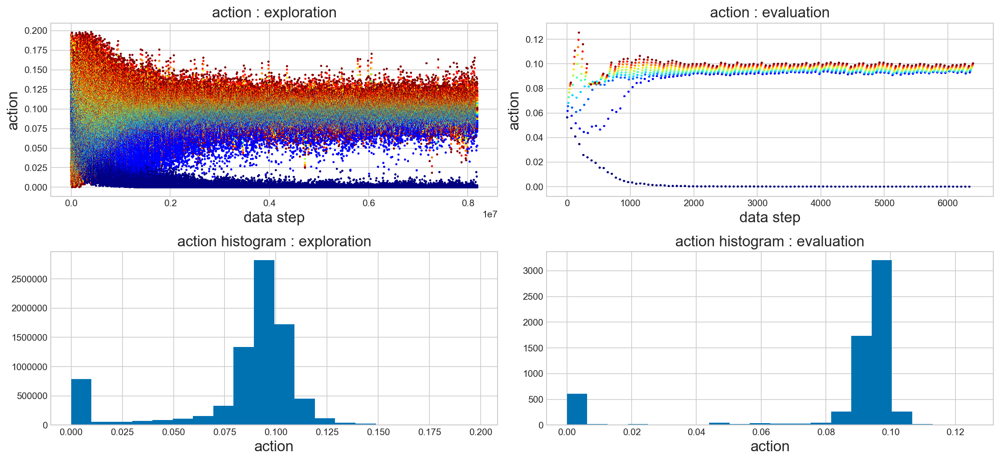

In [16]:
import ES
importlib.reload(ES)
from keras import optimizers

action_min = config['prm_min_NB']
action_max = config['prm_max_IF']

model = ES.gen_model(input_shapes=env.shapes(), n_outputs=1, \
                     hidden_dims=[128, 64, 32], reg_l1=0.0, reg_l2=0.0, \
                     action_min=action_min, action_max=action_max)

#df = pd.DataFrame()
for lr, eps in itertools.product([1e-1], [1e-1]):
    print('======================================================')
    print('lr={}, eps={}'
          .format(lr, eps))
    tester = ES.Tester(env, model, name='ES_01')
    #n_trials = 3
    #n_steps = 10000
    tester.test(n_trials=n_trials, n_episodes=n_steps // 10, n_samples=64,
                gamma=1.0,
                learning_rate_start=lr, learning_rate_end=lr, learning_rate_interval=100,
                epsilon_start=eps, epsilon_end=eps, epsilon_interval=100,
                verbose=False, verbose_interval=100//10, evaluate_interval=100//10, 
                get_log=True)
    
    viz = ES.Visualizer()
    viz.viz_action_history(tester.trainer, state_valuation=lambda x:x[0], action_valuation=lambda x:x,
                       data_span=10,
                       cmap='jet', alpha=1.0, s=1.0)
    
    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['lr'] = lr
        #df_temp['eps'] = eps
        df_temp['Agent'] = 'ES'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

er=0.5, eps=0.01
start testing... :  2019-10-29 00:41:41.848140
start trial 0/5 trial...


100%|██████████| 1000/1000 [1:14:59<00:00,  4.50s/it]


start trial 1/5 trial...


100%|██████████| 1000/1000 [1:13:30<00:00,  4.41s/it]


start trial 2/5 trial...


100%|██████████| 1000/1000 [1:13:37<00:00,  4.42s/it]


start trial 3/5 trial...


100%|██████████| 1000/1000 [1:14:05<00:00,  4.45s/it]


start trial 4/5 trial...


100%|██████████| 1000/1000 [1:13:25<00:00,  4.41s/it]


end testing... :  2019-10-29 06:53:17.364123
loss and reward history


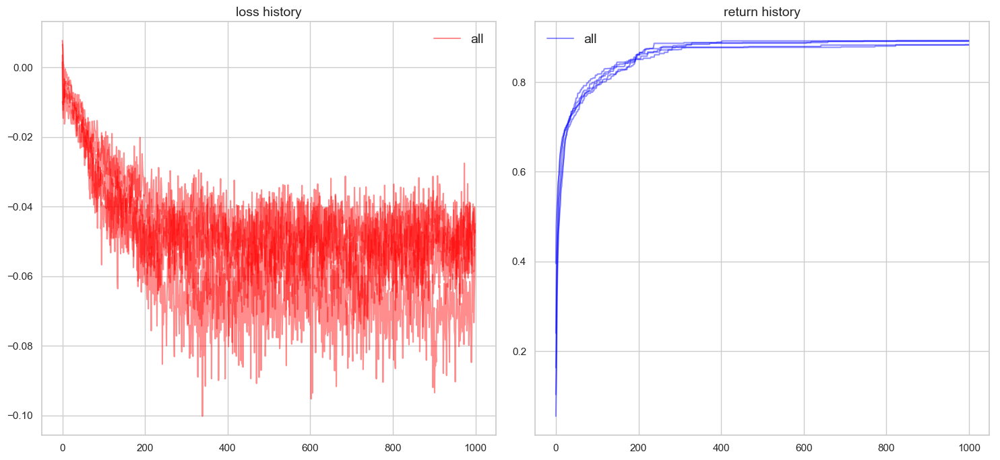

acquired action
action =  [0.]
action =  [0.098]
action =  [0.099]
action =  [0.099]
action =  [0.099]
action =  [0.099]
action =  [0.099]
action =  [0.098]
action =  [0.1]
action =  [0.104]
total_reward [0.891]
param distribution in model


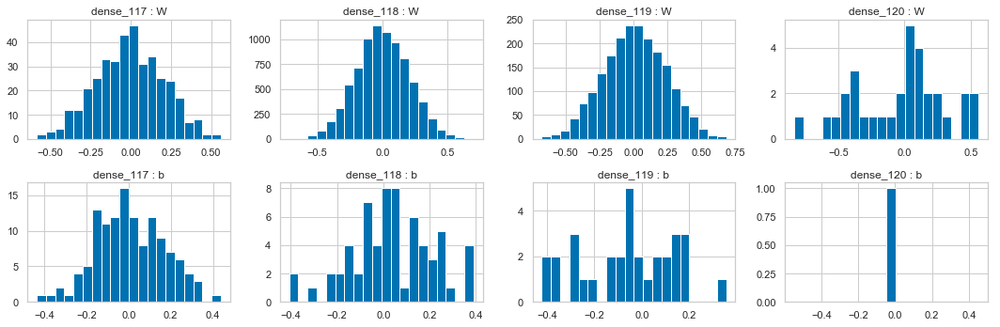

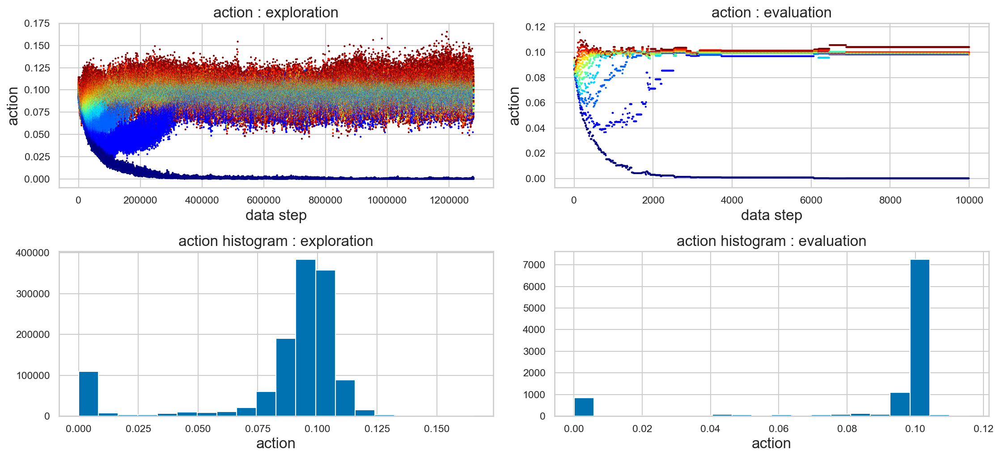

/Users/RyoMiyazaki/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:41: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



In [20]:
env = Env_YRTRenewal.YRTRenewal(term=TERM, mult_action=1, n_agents=1)
config = env.get_config()

import GA
importlib.reload(GA)
from keras import optimizers

action_min = config['prm_min_NB']
action_max = config['prm_max_IF']

model = GA.gen_model(input_shapes=env.shapes(), n_outputs=1, \
                     hidden_dims=[128, 64, 32], reg_l1=0.0, reg_l2=0.0, \
                     action_min=action_min, action_max=action_max)

#df = pd.DataFrame()
for er, eps in itertools.product([0.5], [1e-2]):
    print('======================================================')
    print('er={}, eps={}'
          .format(er, eps))
    tester = GA.Tester(env, model, name='GA_01')
    #n_trials = 3
    #n_steps = 10000
    tester.test(n_trials=n_trials, n_episodes=n_steps // 10, 
                n_samples=64, ratio_elite=er, 
                gamma=1.0,
                epsilon_start=eps, epsilon_end=eps, epsilon_interval=100,
                verbose=False, verbose_interval=100//10, evaluate_interval=100//10, 
                get_log=True)
    
    viz = GA.Visualizer()
    viz.viz_action_history(tester.trainer, state_valuation=lambda x:x[0], action_valuation=lambda x:x,
                       data_span=1,
                       cmap='jet', alpha=1.0, s=1.0)
    
    for trial in range(n_trials):
        df_temp = pd.DataFrame(np.ravel(tester.return_histories[trial]['all']), columns=['return'])
        df_temp['trial'] = trial
        df_temp['t'] = np.arange(len(df_temp))
        #df_temp['er'] = er
        #df_temp['eps'] = eps
        df_temp['Agent'] = 'GA'

        df = pd.concat([df, df_temp])

    #ModelInspection.inspect_hidden_layers(tester.env, tester.model, tester.agent, show_hidden_hist=True)

df.to_csv(tester.name + '.csv')

---
## 3. Results

In [80]:
if False:  # GA のみ後で追加で流した．
    df_GA = pd.read_csv('GA_01.csv')
    df_GA = df_GA[-5000:][::10]
    df_GA['t'] = df_GA['t'] // 10
    df_GA['Agent'] = 'GA'
    df_GA = df_GA.reset_index()

    df_AL = pd.read_csv('ES_01.csv')
    df = pd.concat([df_AL, df_GA])
    df = df.reset_index()

/Users/RyoMiyazaki/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:8: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  


In [87]:
set(df['Agent'])

{'A2C_continuous', 'A2C_discrete', 'AWR', 'DDPG', 'DQN', 'ES', 'GA', 'NAF'}

In [88]:
pd.options.display.precision = 4
ids = ['Agent',]
df[df['t'].max()*0.9<=df['t']].groupby(ids)['return'].describe()

,count,mean,std,min,25%,50%,75%,max
Agent,,,,,,,,
A2C_continuous,50.0,0.8491,0.0109,0.8196,0.8427,0.8512,0.8561,0.8712
A2C_discrete,50.0,0.8999,0.0004,0.8990,0.9000,0.9000,0.9000,0.9000
AWR,50.0,0.8620,0.0100,0.8391,0.8546,0.8610,0.8707,0.8784
DDPG,50.0,0.8857,0.0064,0.8661,0.8815,0.8862,0.8907,0.8961
DQN,50.0,0.8923,0.0127,0.8400,0.8867,0.8990,0.9000,0.9000
ES,50.0,0.8595,0.0060,0.8455,0.8551,0.8599,0.8637,0.8700
GA,50.0,0.8885,0.0044,0.8827,0.8835,0.8912,0.8919,0.8929
NAF,50.0,0.0002,0.0010,0.0000,0.0000,0.0000,0.0000,0.0053


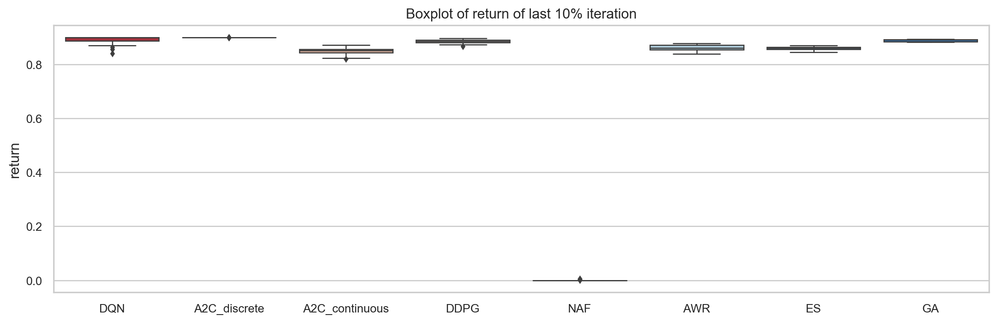

In [89]:
sns.set_style("whitegrid")
sns.set_context("notebook")

plt.figure(figsize=(12, 4), dpi=200)

sns.boxplot(data=df[df['t'].max()*0.9<=df['t']], x='Agent', y='return', orient='v', fliersize=3.0, linewidth=1.0, palette='RdBu')

plt.title('Boxplot of return of last 10% iteration', fontsize=12)
plt.xlabel('', fontsize=12)
plt.ylabel('return', fontsize=12)
plt.tick_params(labelsize=10)

plt.tight_layout()
plt.show()

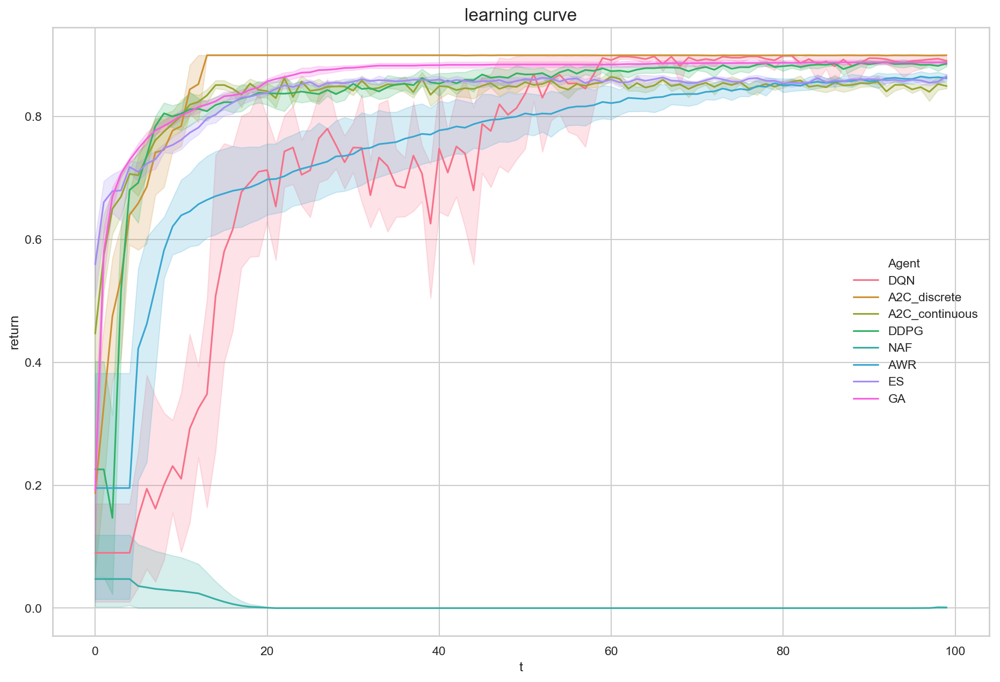

In [90]:
fig = plt.figure(figsize=(15, 10), dpi=150)
sns.lineplot(x='t', y='return', hue='Agent', data=df)
plt.title('learning curve', size=16)
plt.show()